In [1]:
import spacedecomp
from spacedecomp import Factorization
import torch
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import squidpy as sq


In [2]:
adata = sq.datasets.slideseqv2()
X_sums = np.array(np.sum(adata.raw.X > 0, axis=0))[0]
X = np.array(adata.raw.X[:, X_sums>1000].todense() * 1000, dtype=int).T

In [3]:
X.shape

(5899, 41786)

/var/folders/k0/dnsdn2ws5vl0xhxl_60p6pcr0000gq/T/ipykernel_98580/1287859803.py:4: RuntimeWarning: divide by zero encountered in log
  plt.scatter(adata.obsm['spatial'][:,0], adata.obsm['spatial'][:,1], c=np.log(X[i+25]), cmap='jet', alpha=0.1)


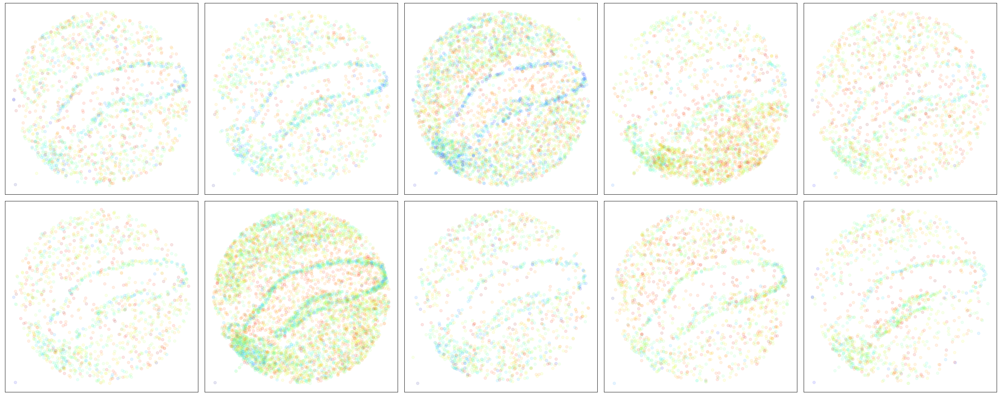

In [4]:
plt.figure(figsize=(30, 12), tight_layout=True)
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.scatter(adata.obsm['spatial'][:,0], adata.obsm['spatial'][:,1], c=np.log(X[i+25]), cmap='jet', alpha=0.1)
    plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])

In [11]:
model = Factorization(X, laten_dim=10, train_loadings=True, type='PNMF')

In [12]:
history = model.train(torch.tensor(X), lr=1e-2, epochs=1500)

  0%|          | 0/1500 [00:00<?, ?it/s]

Finished training


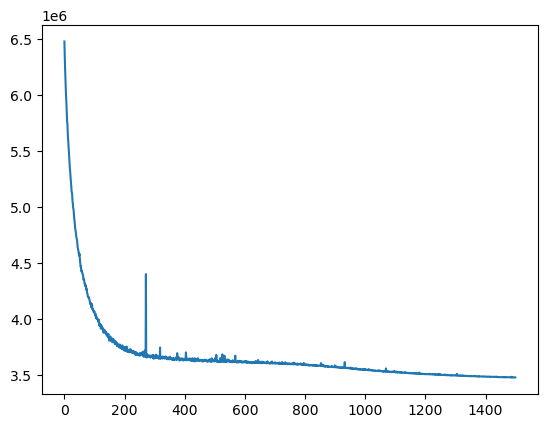

In [13]:
plt.plot(history)

### Visualize Factors

In [14]:
F = model.q_f.sample().numpy()

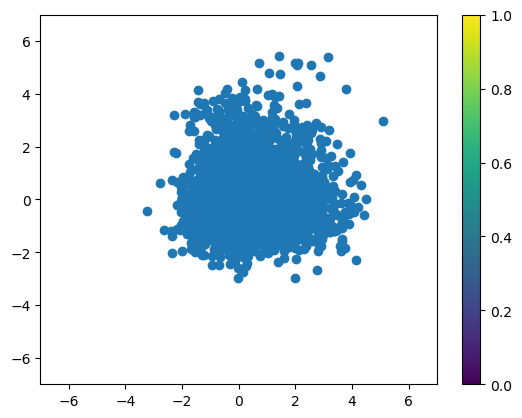

In [15]:
plt.scatter(F[:, 0], F[:, 1], cmap='tab20')
plt.ylim([-7, 7])
plt.xlim([-7, 7])
plt.colorbar()

### Visualize Loadings

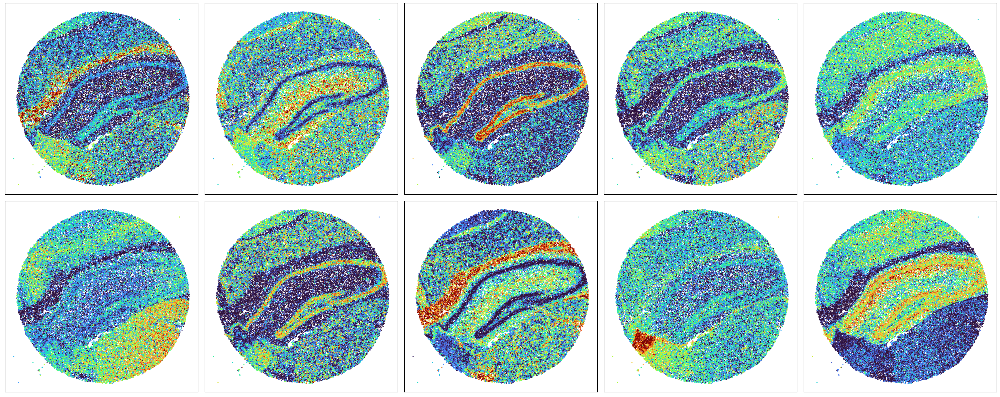

In [17]:
plt.figure(figsize=(30, 12), tight_layout=True)
loadings = torch.abs(model.W).detach().cpu().numpy()
max_val = np.percentile(loadings, 99)
min_val = np.percentile(loadings, 1)

for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.scatter(adata.obsm['spatial'][:,0], adata.obsm['spatial'][:,1], c=loadings[:,i],  vmin=min_val, vmax=max_val, cmap='turbo', alpha=0.9, s=2)
    plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])